In [53]:
import nltk # Imports the library
#nltk.download() #Download the necessary datasets
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [54]:
from google.colab import files
files.upload()

Saving Corona_NLP_train.csv to Corona_NLP_train (1).csv
Saving Corona_NLP_test.csv to Corona_NLP_test (1).csv


{'Corona_NLP_train (1).csv': b'UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment\r\n3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8,Neutral\r\n3800,48752,UK,16-03-2020,advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive\r\n3801,48753,Vagabonds,16-03-2020,"Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P",Positive\r\n3802,48754,,16-03-2020,"My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don\'t panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementot

In [55]:
!pip install -q kaggle

In [56]:
dftrain = pd.read_csv('Corona_NLP_train.csv',encoding='ISO-8859-1',index_col=False)

In [57]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

dftrain

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive
2,3801,48753,Vagabonds,16-03-2020,"Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P",Positive
3,3802,48754,NaN,16-03-2020,"My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don't panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j",Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COVID19 outbreak.\r\r\n\r\r\nNot because I'm paranoid, but because my food stock is litteraly empty. The #coronavirus is a serious thing, but please, don't panic. It causes shortage...\r\r\n\r\r\n#CoronavirusFrance #restezchezvous #StayAtHome #confinement https://t.co/usmuaLq72n",Extremely Negative
...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",14-04-2020,Airline pilots offering to stock supermarket shelves in #NZ lockdown #COVID-19 https://t.co/cz89uA0HNp,Neutral
41153,44952,89904,NaN,14-04-2020,Response to complaint not provided citing COVID-19 related delays. Yet prompt in rejecting policy before consumer TAT is over. Way to go ?,Extremely Negative
41154,44953,89905,NaN,14-04-2020,"You know itÂs getting tough when @KameronWilds is rationing toilet paper #coronavirus #toiletpaper @kroger martinsville, help us out!!",Positive
41155,44954,89906,NaN,14-04-2020,Is it wrong that the smell of hand sanitizer is starting to turn me on?\r\r\n\r\r\n#coronavirus #COVID19 #coronavirus,Neutral


In [58]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41157 entries, 0 to 41156
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   UserName       41157 non-null  int64 
 1   ScreenName     41157 non-null  int64 
 2   Location       32567 non-null  object
 3   TweetAt        41157 non-null  object
 4   OriginalTweet  41157 non-null  object
 5   Sentiment      41157 non-null  object
dtypes: int64(2), object(4)
memory usage: 1.9+ MB


In [59]:
# Function to count the number of words in a text
def count_words(text):
    return len(text.split())

# Apply the count_words function to the 'text' column and create a new 'text_length' column
dftrain['text length bef_cleanup'] = dftrain['OriginalTweet'].apply(count_words)

# Display the updated DataFrame
dftrain.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8,Neutral,8
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38
2,3801,48753,Vagabonds,16-03-2020,"Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P",Positive,14
3,3802,48754,NaN,16-03-2020,"My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don't panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j",Positive,42
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COVID19 outbreak.\r\r\n\r\r\nNot because I'm paranoid, but because my food stock is litteraly empty. The #coronavirus is a serious thing, but please, don't panic. It causes shortage...\r\r\n\r\r\n#CoronavirusFrance #restezchezvous #StayAtHome #confinement https://t.co/usmuaLq72n",Extremely Negative,40


In [60]:
# Convert the date column to datetime format
dftrain['TweetAt'] = pd.to_datetime(dftrain['TweetAt'], format='%d-%m-%Y')
dftrain

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup
0,3799,48751,London,2020-03-16,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8,Neutral,8
1,3800,48752,UK,2020-03-16,advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38
2,3801,48753,Vagabonds,2020-03-16,"Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P",Positive,14
3,3802,48754,NaN,2020-03-16,"My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don't panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j",Positive,42
4,3803,48755,NaN,2020-03-16,"Me, ready to go at supermarket during the #COVID19 outbreak.\r\r\n\r\r\nNot because I'm paranoid, but because my food stock is litteraly empty. The #coronavirus is a serious thing, but please, don't panic. It causes shortage...\r\r\n\r\r\n#CoronavirusFrance #restezchezvous #StayAtHome #confinement https://t.co/usmuaLq72n",Extremely Negative,40
...,...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",2020-04-14,Airline pilots offering to stock supermarket shelves in #NZ lockdown #COVID-19 https://t.co/cz89uA0HNp,Neutral,12
41153,44952,89904,NaN,2020-04-14,Response to complaint not provided citing COVID-19 related delays. Yet prompt in rejecting policy before consumer TAT is over. Way to go ?,Extremely Negative,23
41154,44953,89905,NaN,2020-04-14,"You know itÂs getting tough when @KameronWilds is rationing toilet paper #coronavirus #toiletpaper @kroger martinsville, help us out!!",Positive,18
41155,44954,89906,NaN,2020-04-14,Is it wrong that the smell of hand sanitizer is starting to turn me on?\r\r\n\r\r\n#coronavirus #COVID19 #coronavirus,Neutral,18


In [61]:
dftrain['Sentiment'].value_counts()

Positive              11422
Negative               9917
Neutral                7713
Extremely Positive     6624
Extremely Negative     5481
Name: Sentiment, dtype: int64

In [62]:
# Replace values in the 'Sentiment' column
replace_dict = {
    'Extremely Positive': 'Positive',
    'Extremely Negative': 'Negative'
}
dftrain['Sentiment'] = dftrain['Sentiment'].replace(replace_dict)

In [63]:
dftrain['Sentiment'].value_counts()

Positive    18046
Negative    15398
Neutral      7713
Name: Sentiment, dtype: int64

In [64]:
dftrain['Location'].value_counts()

London                          540
United States                   528
London, England                 520
New York, NY                    395
Washington, DC                  373
                               ... 
Staffordshire Moorlands           1
Kithchener ON                     1
Tulsa, Ok                         1
Watford, South Oxhey, Bushey      1
i love you so much || he/him      1
Name: Location, Length: 12220, dtype: int64

In [65]:
dftrain.isna().sum()

UserName                      0
ScreenName                    0
Location                   8590
TweetAt                       0
OriginalTweet                 0
Sentiment                     0
text length bef_cleanup       0
dtype: int64

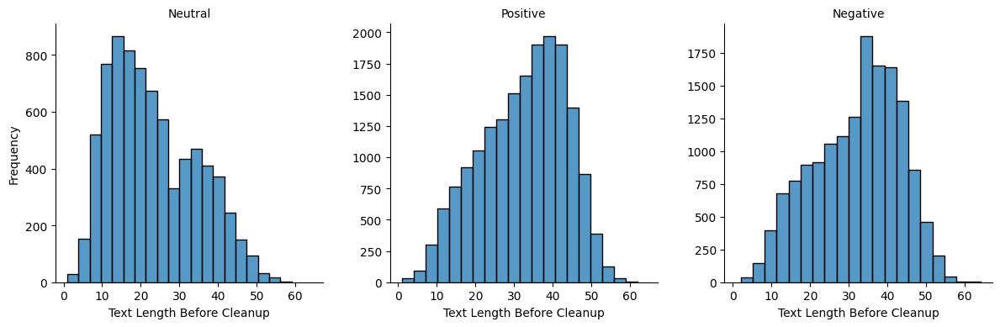

In [66]:
# Create a FacetGrid with histograms
g = sns.FacetGrid(dftrain, col="Sentiment", height=4, sharey=False)
g.map(sns.histplot, "text length bef_cleanup", bins=20)

# Add titles and labels
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Text Length Before Cleanup", "Frequency")

# Show the plot
plt.show()

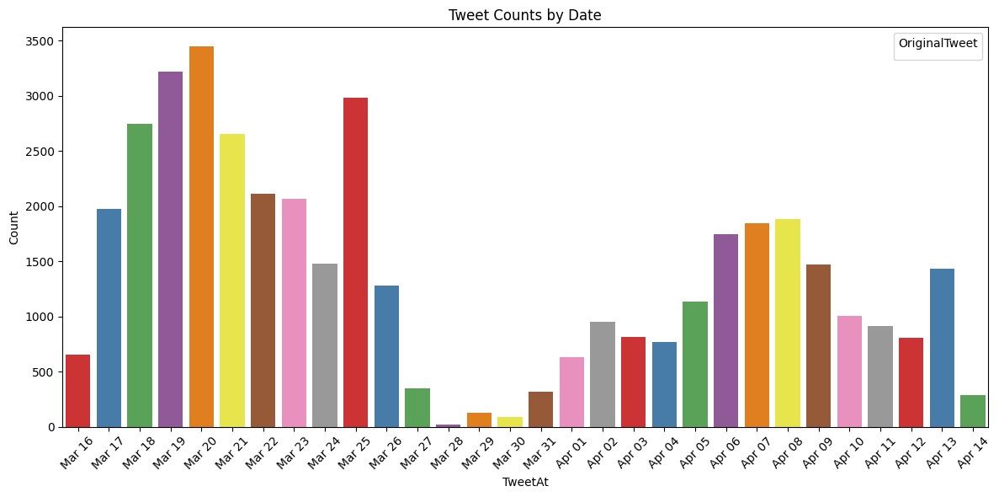

In [67]:
import warnings
warnings.filterwarnings('ignore')

# Create the countplot
plt.figure(figsize=(12, 6))
sns.countplot(data=dftrain, x='TweetAt', palette='Set1')

# Set labels and title
plt.xlabel('TweetAt')
plt.ylabel('Count')
plt.title('Tweet Counts by Date')

## Get unique dates and format them as abbreviated dates
unique_dates = dftrain['TweetAt'].dt.date.unique()
formatted_dates = [dt.strftime('%b %d') for dt in unique_dates]

# Set x-axis ticks and labels
plt.xticks(ticks=range(len(unique_dates)), labels=formatted_dates, rotation=45)

# Show the plot
plt.legend(title='OriginalTweet')
plt.tight_layout()
plt.show()

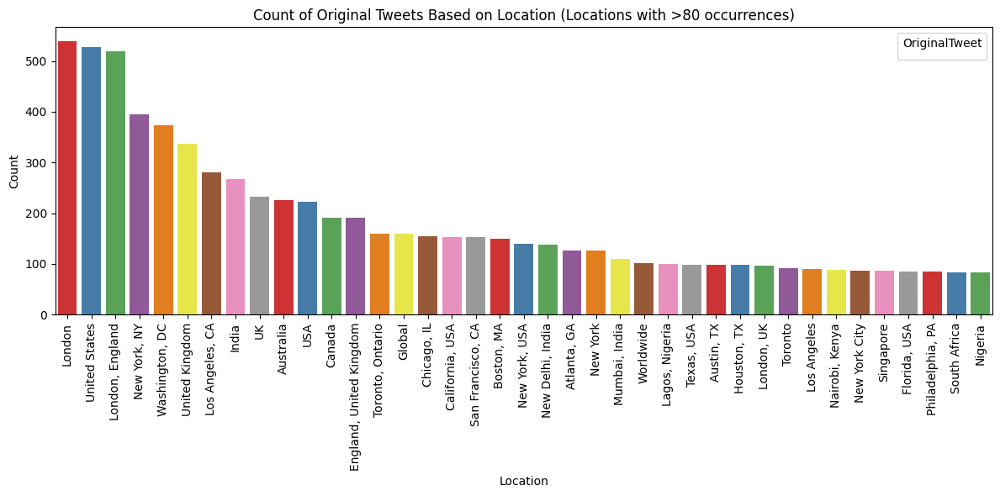

In [68]:
# Count the occurrences of each location
location_counts = dftrain['Location'].value_counts()

# Filter locations with counts greater than 80
popular_locations = location_counts[location_counts > 80].index

# Filter the dataframe based on popular locations
df_filtered = dftrain[dftrain['Location'].isin(popular_locations)]

# Sort locations by counts in descending order
sorted_locations = df_filtered['Location'].value_counts().index

# Create the countplot
plt.figure(figsize=(12, 6))
sns.countplot(data=df_filtered, x='Location', palette='Set1', order=sorted_locations)

# Set labels and title
plt.xlabel('Location')
plt.ylabel('Count')
plt.title('Count of Original Tweets Based on Location (Locations with >80 occurrences)')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=90)

# Show the plot
plt.legend(title='OriginalTweet')
plt.tight_layout()
plt.show()

In [69]:
dftrain.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup
0,3799,48751,London,2020-03-16,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8,Neutral,8
1,3800,48752,UK,2020-03-16,advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38
2,3801,48753,Vagabonds,2020-03-16,"Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P",Positive,14
3,3802,48754,NaN,2020-03-16,"My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don't panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j",Positive,42
4,3803,48755,NaN,2020-03-16,"Me, ready to go at supermarket during the #COVID19 outbreak.\r\r\n\r\r\nNot because I'm paranoid, but because my food stock is litteraly empty. The #coronavirus is a serious thing, but please, don't panic. It causes shortage...\r\r\n\r\r\n#CoronavirusFrance #restezchezvous #StayAtHome #confinement https://t.co/usmuaLq72n",Negative,40


In [70]:
import re

def clean_tweet(tweet):
    # Remove URLs
    tweet = re.sub(r'http\S+', '', tweet)

    # Remove mentions (@username)
    tweet = re.sub(r'@\w+', '', tweet)

    # Remove hashtags (#)
    tweet = re.sub(r'#', '', tweet)

    # Remove hashtags (#)
    tweet = re.sub(r'-', '', tweet)

    # Remove special characters and punctuations (except alphanumeric and spaces)
    tweet = re.sub(r'[^\w\s]', '', tweet)

    # Remove non-ASCII characters
    tweet = tweet.encode('ascii', 'ignore').decode()

    # Convert to lowercase
    tweet = tweet.lower()

    # Remove extra whitespaces
    tweet = ' '.join(tweet.split())

    return tweet

# Apply the clean_tweet function to the 'TweetAt' column
dftrain['OriginalTweet'] = dftrain['OriginalTweet'].apply(clean_tweet)

In [71]:
dftrain

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup
0,3799,48751,London,2020-03-16,and and,Neutral,8
1,3800,48752,UK,2020-03-16,advice talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist gp set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38
2,3801,48753,Vagabonds,2020-03-16,coronavirus australia woolworths to give elderly disabled dedicated shopping hours amid covid19 outbreak,Positive,14
3,3802,48754,NaN,2020-03-16,my food stock is not the only one which is empty please dont panic there will be enough food for everyone if you do not take more than you need stay calm stay safe covid19france covid_19 covid19 coronavirus confinement confinementotal confinementgeneral,Positive,42
4,3803,48755,NaN,2020-03-16,me ready to go at supermarket during the covid19 outbreak not because im paranoid but because my food stock is litteraly empty the coronavirus is a serious thing but please dont panic it causes shortage coronavirusfrance restezchezvous stayathome confinement,Negative,40
...,...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",2020-04-14,airline pilots offering to stock supermarket shelves in nz lockdown covid19,Neutral,12
41153,44952,89904,NaN,2020-04-14,response to complaint not provided citing covid19 related delays yet prompt in rejecting policy before consumer tat is over way to go,Negative,23
41154,44953,89905,NaN,2020-04-14,you know its getting tough when is rationing toilet paper coronavirus toiletpaper martinsville help us out,Positive,18
41155,44954,89906,NaN,2020-04-14,is it wrong that the smell of hand sanitizer is starting to turn me on coronavirus covid19 coronavirus,Neutral,18


In [72]:
# Function to count the number of words in a text
def count_words(text):
    return len(text.split())

# Apply the count_words function to the 'text' column and create a new 'text_length' column
dftrain['text length after_cleanup'] = dftrain['OriginalTweet'].apply(count_words)

# Display the updated DataFrame
dftrain.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup,text length after_cleanup
0,3799,48751,London,2020-03-16,and and,Neutral,8,2
1,3800,48752,UK,2020-03-16,advice talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist gp set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38,38
2,3801,48753,Vagabonds,2020-03-16,coronavirus australia woolworths to give elderly disabled dedicated shopping hours amid covid19 outbreak,Positive,14,13
3,3802,48754,NaN,2020-03-16,my food stock is not the only one which is empty please dont panic there will be enough food for everyone if you do not take more than you need stay calm stay safe covid19france covid_19 covid19 coronavirus confinement confinementotal confinementgeneral,Positive,42,41
4,3803,48755,NaN,2020-03-16,me ready to go at supermarket during the covid19 outbreak not because im paranoid but because my food stock is litteraly empty the coronavirus is a serious thing but please dont panic it causes shortage coronavirusfrance restezchezvous stayathome confinement,Negative,40,39


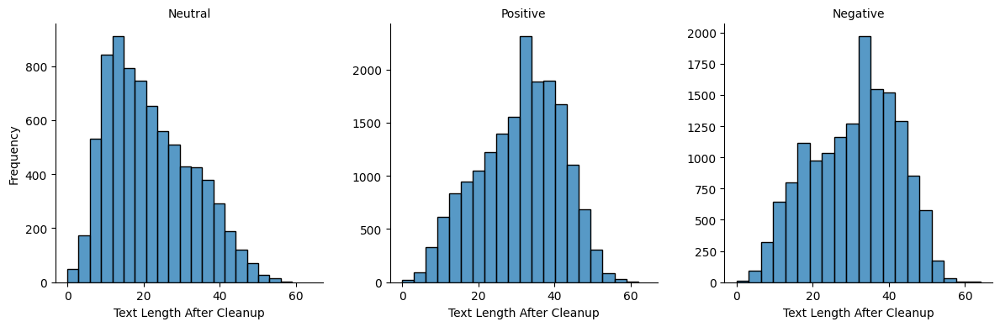

In [73]:
# Create a FacetGrid with histograms
g = sns.FacetGrid(dftrain, col="Sentiment", height=4, sharey=False)
g.map(sns.histplot, "text length after_cleanup", bins=20)

# Add titles and labels
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Text Length After Cleanup", "Frequency")

# Show the plot
plt.show()

In [74]:
dftrain.isna().sum()

UserName                        0
ScreenName                      0
Location                     8590
TweetAt                         0
OriginalTweet                   0
Sentiment                       0
text length bef_cleanup         0
text length after_cleanup       0
dtype: int64

In [75]:
filtered_df = dftrain[dftrain['text length after_cleanup'] > 5]
filtered_df.head(100)

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup,text length after_cleanup
1,3800,48752,UK,2020-03-16,advice talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist gp set up online shopping accounts if poss adequate supplies of regular meds but not over order,Positive,38,38
2,3801,48753,Vagabonds,2020-03-16,coronavirus australia woolworths to give elderly disabled dedicated shopping hours amid covid19 outbreak,Positive,14,13
3,3802,48754,NaN,2020-03-16,my food stock is not the only one which is empty please dont panic there will be enough food for everyone if you do not take more than you need stay calm stay safe covid19france covid_19 covid19 coronavirus confinement confinementotal confinementgeneral,Positive,42,41
4,3803,48755,NaN,2020-03-16,me ready to go at supermarket during the covid19 outbreak not because im paranoid but because my food stock is litteraly empty the coronavirus is a serious thing but please dont panic it causes shortage coronavirusfrance restezchezvous stayathome confinement,Negative,40,39
5,3804,48756,"ÃT: 36.319708,-82.363649",2020-03-16,as news of the regions first confirmed covid19 case came out of sullivan county last week people flocked to area stores to purchase cleaning supplies hand sanitizer food toilet paper and other goods reports,Positive,36,34
...,...,...,...,...,...,...,...,...
97,3896,48848,"Washington, DC",2020-03-16,instead of paid sick leave is providing 2 weeks paid leave only to people who test positive for covid19 or are placed under mandatory quarantine this is insufficient to protect staff and the public especially with little testing av,Positive,41,39
98,3897,48849,San Joaquin Valley CA,2020-03-16,i followed this when i went shopping a few days ago its a pain but necessary protect yourself from grocery shopping consumer reports covid2019 stayhealthy,Positive,27,25
99,3898,48850,Planet Earth,2020-03-16,i took these pictures today at my home grocery store in montgomery county md no flour sugar sweet potatoes potatoes orange juice paper towels or toilet paper low on meat mac amp cheese coronapocolypse covid_19 panicbuying,Negative,37,36
100,3899,48851,"Portsmouth, England",2020-03-16,i hate grocery shopping in general but i swear im doing it online next shop can not deal with the swathes of panic buyers at all covid19 coronavirus coronavirusuk anxiety panicbuyinguk morons,Negative,32,32


In [76]:
filtered_df2 = dftrain[dftrain['text length after_cleanup'] <= 5]
filtered_df2.head(50)

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup,text length after_cleanup
0,3799,48751,London,2020-03-16,and and,Neutral,8,2
16,3815,48767,Saudi Arabia,2020-03-16,_ 13 _,Neutral,32,3
155,3954,48906,"Nairobi, Kenya",2020-03-16,cleanshelf supermarket sanitizers 19,Neutral,4,4
186,3985,48937,United States,2020-03-16,,Neutral,19,0
239,4038,48990,Right behind you :),2020-03-16,please read this thread,Positive,4,4
255,4054,49006,Lurking,2020-03-16,binge shopping online quarantinelife coronavirus,Neutral,5,5
378,4177,49129,"Berkeley, CA",2020-03-16,heres the full list,Neutral,5,4
397,4196,49148,"Islamabad, Pakistan",2020-03-16,coronavirusinpakistan,Neutral,22,1
494,4293,49245,"Texas, USA",2020-03-16,student resources during covid19,Neutral,5,4
557,4356,49308,"Stamford, CT",2020-03-16,cleanup on aisle 316 316day,Positive,6,5


In [77]:
filtered_df = filtered_df.sample(frac=1).reset_index(drop=True)


In [78]:
filtered_df

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup,text length after_cleanup
0,14896,59848,"Fargo, ND",2020-03-20,grocery store had the ingredients to make the picklepeanut butter sandwhich it was pretty solid definitely going to do it again thanks sandwhiches coronavirus quarentinelife,Positive,28,25
1,34051,79003,New York and the World,2020-04-06,the virus is starting to disrupt global food supplies well need government interventions to stop a crisis via,Negative,20,18
2,21260,66212,"Launceston, Australia",2020-03-23,is golds safe haven status taking a hit from the coronavirus investors currently prefer cash and china india demand is being pummeled by high domestic bullion prices slowing growth metals,Positive,32,30
3,27663,72615,"Maadi, Cairo, Egypt",2020-03-26,i took my instant dry yeast back to egypt with me in december but i have a jar in my fridge that should still be good all out of stock everywhere its like trying to find toilet papercoronavirus hoarding via,Positive,42,40
4,10360,55312,In Christ,2020-03-19,the decision to increase dstv prices in april has been reversed covid19 is working wonders lol,Positive,16,16
...,...,...,...,...,...,...,...,...
40793,20746,65698,??,2020-03-23,actual picture of the hand sanitizer at the near my house i wanted to take it and see if the security guy would tackle me,Positive,25,25
40794,19102,64054,NaN,2020-03-22,can you champion prison officers that are going behind the walls with the most dangerous in society please these places have covid19 cases let alone we have to deal with escalated violence during lockdown we cant get food and essentials,Negative,41,40
40795,16943,61895,NaN,2020-03-21,the ved today when i go to the supermarket you must sterilize your hands and wear a gloves before holding a shopping cart coronavirus panickbuying,Neutral,29,25
40796,17100,62052,London,2020-03-21,reading how the rich are behaving during this pandemic building bunkers that filter covid19 renting properties at inflated prices and buying tests for hundreds of pounds is making me feel sick but mostly sad for them,Negative,36,36


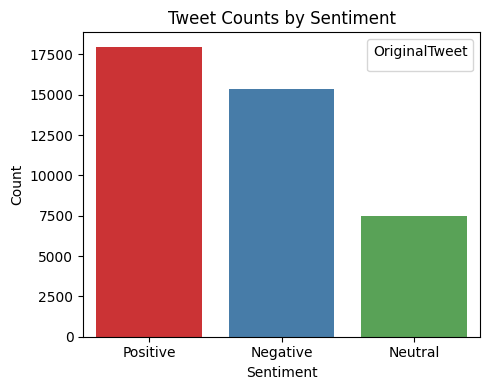

In [79]:
# Create the countplot
plt.figure(figsize=(5, 4))
sns.countplot(data=filtered_df, x='Sentiment', palette='Set1')

# Set labels and title
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Tweet Counts by Sentiment')


# Show the plot
plt.legend(title='OriginalTweet')
plt.tight_layout()
plt.show()

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

In [81]:
# List of stopwords to remove, not using the built in library for this run.
# We will use the built in library for BERT and roBERTa.

stopwords = [
    "i", "me", "my", "myself", "we", "our", "ours", "ourselves", "you", "your", "yours", "yourself",
    "yourselves", "he", "him", "his", "himself", "she", "her", "hers", "herself", "it", "its", "itself",
    "they", "them", "their", "theirs", "themselves", "what", "which", "who", "whom", "this", "that",
    "these", "those", "am", "is", "are", "was", "were", "be", "been", "being", "have", "has", "had", "having",
    "do", "does", "did", "doing", "a", "an", "the", "and", "but", "if", "or", "because", "as", "until", "while",
    "of", "at", "by", "for", "with", "about", "against", "between", "into", "through", "during", "before",
    "after", "above", "below", "to", "from", "up", "down", "in", "out", "on", "off", "over", "under", "again",
    "further", "then", "once", "here", "there", "when", "where", "why", "how", "all", "any", "both", "each",
    "few", "more", "most", "other", "some", "such", "no", "nor", "not", "only", "own", "same", "so", "than",
    "too", "very", "s", "t", "can", "will", "just", "don", "should", "now"
]

In [82]:
# Create a pipeline
pipeline = Pipeline([
    ('count_vectorizer', CountVectorizer(stop_words=stopwords)),  # Step 1: CountVectorizer
    ('tfidf_transformer', TfidfTransformer()),  # Step 2: TfidfTransformer
    ('classifier', MultinomialNB())  # Step 3: MultinomialNB classifier
])

In [83]:
# Define features and target
X = filtered_df.drop(["Sentiment", "Location", "ScreenName", "UserName", "TweetAt", "text length bef_cleanup","text length after_cleanup"], axis=1)
y = filtered_df["Sentiment"]



# Split data into train, validation, and test
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

In [84]:
print(y_train.shape)
print(X_train.shape)
#X_train

(28558,)
(28558, 1)


In [85]:
X_train_column = X_train['OriginalTweet'].values.ravel()

In [86]:
X_train_column.shape

(28558,)

In [87]:
X_train=X_train_column

y_train.shape

(28558,)

In [88]:
from imblearn.over_sampling import RandomOverSampler

# Reshape the X_train array to have a single feature
X_train_reshaped = X_train.reshape(-1, 1)



# Print counts before oversampling
print("Class distribution before oversampling:")
print(y_train.value_counts())

# Apply random oversampling to balance the classes
ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train_reshaped, y_train)

# Print counts after oversampling
print("\nClass distribution after oversampling:")
print(y_train_resampled.value_counts())

Class distribution before oversampling:
Positive    12645
Negative    10671
Neutral      5242
Name: Sentiment, dtype: int64

Class distribution after oversampling:
Positive    12645
Negative    12645
Neutral     12645
Name: Sentiment, dtype: int64


In [89]:
print("X_train shape:", X_train_resampled.shape)
print("y_train shape:", y_train_resampled.shape)

X_train shape: (37935, 1)
y_train shape: (37935,)


In [90]:
flatened_Xtrain_resampled = X_train_resampled.flatten()

In [91]:
# Fit the pipeline to the training data
pipeline.fit(flatened_Xtrain_resampled, y_train_resampled)

Pipeline(steps=[('count_vectorizer',
                 CountVectorizer(stop_words=['i', 'me', 'my', 'myself', 'we',
                                             'our', 'ours', 'ourselves', 'you',
                                             'your', 'yours', 'yourself',
                                             'yourselves', 'he', 'him', 'his',
                                             'himself', 'she', 'her', 'hers',
                                             'herself', 'it', 'its', 'itself',
                                             'they', 'them', 'their', 'theirs',
                                             'themselves', 'what', ...])),
                ('tfidf_transformer', TfidfTransformer()),
                ('classifier', MultinomialNB())])

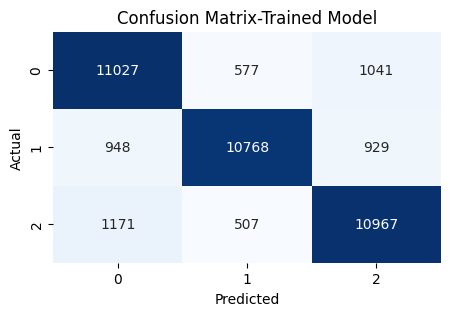

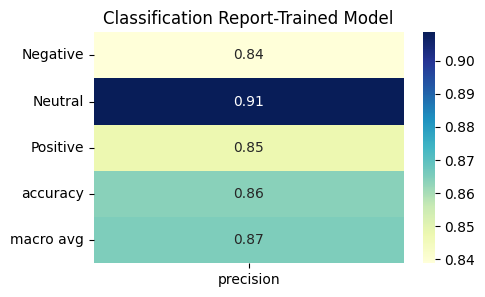

In [92]:
# Metrics for Training data
y_predtrain = pipeline.predict(flatened_Xtrain_resampled)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_train_resampled, y_predtrain)

# Generate the classification report
class_report = classification_report(y_train_resampled, y_predtrain, output_dict=True)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix-Trained Model')
plt.show()

# Convert the classification report to a DataFrame
class_report_df = pd.DataFrame(class_report).transpose()

# Print the classification report as a heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(class_report_df.iloc[:-1, :-3], annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Classification Report-Trained Model')
plt.show()

In [93]:
X_val_column = X_val['OriginalTweet'].values.ravel()

In [94]:
flatened_Xval = X_val_column.flatten()

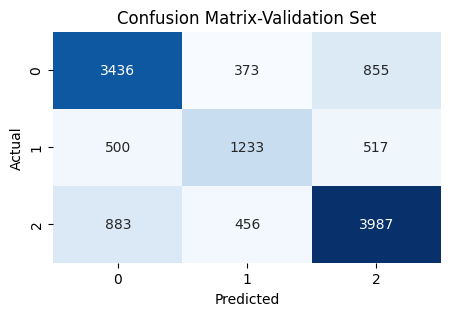

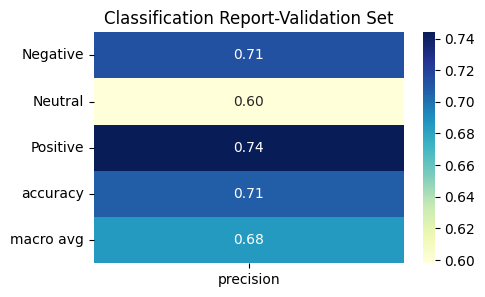

In [95]:
# Predict using the pipeline with validation data
y_pred = pipeline.predict(flatened_Xval)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_val, y_pred)

# Generate the classification report
class_report = classification_report(y_val, y_pred, output_dict=True)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(5, 3))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix-Validation Set')
plt.show()

# Convert the classification report to a DataFrame
class_report_df = pd.DataFrame(class_report).transpose()

# Print the classification report as a heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(class_report_df.iloc[:-1, :-3], annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Classification Report-Validation Set')
plt.show()

In [96]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import nltk
from nltk.corpus import stopwords

In [97]:
filtered_df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,text length bef_cleanup,text length after_cleanup
0,14896,59848,"Fargo, ND",2020-03-20,grocery store had the ingredients to make the picklepeanut butter sandwhich it was pretty solid definitely going to do it again thanks sandwhiches coronavirus quarentinelife,Positive,28,25
1,34051,79003,New York and the World,2020-04-06,the virus is starting to disrupt global food supplies well need government interventions to stop a crisis via,Negative,20,18
2,21260,66212,"Launceston, Australia",2020-03-23,is golds safe haven status taking a hit from the coronavirus investors currently prefer cash and china india demand is being pummeled by high domestic bullion prices slowing growth metals,Positive,32,30
3,27663,72615,"Maadi, Cairo, Egypt",2020-03-26,i took my instant dry yeast back to egypt with me in december but i have a jar in my fridge that should still be good all out of stock everywhere its like trying to find toilet papercoronavirus hoarding via,Positive,42,40
4,10360,55312,In Christ,2020-03-19,the decision to increase dstv prices in april has been reversed covid19 is working wonders lol,Positive,16,16


In [98]:
filtered_df = filtered_df.drop(["Location", "ScreenName", "UserName", "TweetAt", "text length bef_cleanup","text length after_cleanup"], axis=1)
filtered_df.head()

,OriginalTweet,Sentiment
0,grocery store had the ingredients to make the picklepeanut butter sandwhich it was pretty solid definitely going to do it again thanks sandwhiches coronavirus quarentinelife,Positive
1,the virus is starting to disrupt global food supplies well need government interventions to stop a crisis via,Negative
2,is golds safe haven status taking a hit from the coronavirus investors currently prefer cash and china india demand is being pummeled by high domestic bullion prices slowing growth metals,Positive
3,i took my instant dry yeast back to egypt with me in december but i have a jar in my fridge that should still be good all out of stock everywhere its like trying to find toilet papercoronavirus hoarding via,Positive
4,the decision to increase dstv prices in april has been reversed covid19 is working wonders lol,Positive


In [99]:
# Encode labels (e.g., 'Positive' -> 0, 'Negative' -> 1, 'Neutral' -> 2)
label_mapping = {'Positive': 0, 'Negative': 1, 'Neutral': 2}
filtered_df['Sentiment'] = filtered_df['Sentiment'].map(label_mapping)
filtered_df

,OriginalTweet,Sentiment
0,grocery store had the ingredients to make the picklepeanut butter sandwhich it was pretty solid definitely going to do it again thanks sandwhiches coronavirus quarentinelife,0
1,the virus is starting to disrupt global food supplies well need government interventions to stop a crisis via,1
2,is golds safe haven status taking a hit from the coronavirus investors currently prefer cash and china india demand is being pummeled by high domestic bullion prices slowing growth metals,0
3,i took my instant dry yeast back to egypt with me in december but i have a jar in my fridge that should still be good all out of stock everywhere its like trying to find toilet papercoronavirus hoarding via,0
4,the decision to increase dstv prices in april has been reversed covid19 is working wonders lol,0
...,...,...
40793,actual picture of the hand sanitizer at the near my house i wanted to take it and see if the security guy would tackle me,0
40794,can you champion prison officers that are going behind the walls with the most dangerous in society please these places have covid19 cases let alone we have to deal with escalated violence during lockdown we cant get food and essentials,1
40795,the ved today when i go to the supermarket you must sterilize your hands and wear a gloves before holding a shopping cart coronavirus panickbuying,2
40796,reading how the rich are behaving during this pandemic building bunkers that filter covid19 renting properties at inflated prices and buying tests for hundreds of pounds is making me feel sick but mostly sad for them,1


In [100]:
# Download the stopwords dataset (only need to run this once)
nltk.download('stopwords')

# Define a function to remove stopwords from text
stop_words = set(stopwords.words('english'))

def remove_stopwords(text):
    words = text.split()
    filtered_words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

# Apply stopwords removal to your DataFrame
filtered_df['OriginalTweet'] = filtered_df['OriginalTweet'].apply(remove_stopwords)
filtered_df

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,OriginalTweet,Sentiment
0,grocery store ingredients make picklepeanut butter sandwhich pretty solid definitely going thanks sandwhiches coronavirus quarentinelife,0
1,virus starting disrupt global food supplies well need government interventions stop crisis via,1
2,golds safe status taking hit coronavirus investors currently prefer cash china india demand pummeled high domestic bullion prices slowing growth metals,0
3,took instant dry yeast back egypt december jar fridge still good stock everywhere like trying find toilet papercoronavirus hoarding via,0
4,decision increase dstv prices april reversed covid19 working wonders lol,0
...,...,...
40793,actual picture hand sanitizer near house wanted take see security guy would tackle,0
40794,champion prison officers going behind walls dangerous society please places covid19 cases let alone deal escalated violence lockdown cant get food essentials,1
40795,ved today go supermarket must sterilize hands wear gloves holding shopping cart coronavirus panickbuying,2
40796,reading rich behaving pandemic building bunkers filter covid19 renting properties inflated prices buying tests hundreds pounds making feel sick mostly sad,1


In [101]:
# Split the data into training, validation, and test sets. This time I am adding a validation set to evaluate
# fine tuned model before introducing the test set.
train_df, temp_df = train_test_split(filtered_df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

In [ ]:
import torch
import torch.nn as nn
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm  # Add tqdm for progress bars

# Define the DistilBERT model and tokenizer
model_name = 'distilbert-base-uncased'  # Use the smaller DistilBERT model
tokenizer = DistilBertTokenizer.from_pretrained(model_name)
model = DistilBertForSequenceClassification.from_pretrained(model_name, num_labels=3)

# Tokenize and preprocess the text data
def tokenize_text(text):
    tokens = tokenizer.encode(text, add_special_tokens=True, padding=True, truncation=True, max_length=64)  # Reduced sequence length
    return tokens

train_df['TokenizedText'] = train_df['OriginalTweet'].apply(tokenize_text)
val_df['TokenizedText'] = val_df['OriginalTweet'].apply(tokenize_text)
test_df['TokenizedText'] = test_df['OriginalTweet'].apply(tokenize_text)

import torch
from torch.nn.utils.rnn import pad_sequence

# Convert tokenized data to PyTorch tensors with padding
X_train = pad_sequence([torch.tensor(seq) for seq in train_df['TokenizedText']], batch_first=True)
y_train = torch.tensor(train_df['Sentiment'].tolist())
X_val = pad_sequence([torch.tensor(seq) for seq in val_df['TokenizedText']], batch_first=True)
y_val = torch.tensor(val_df['Sentiment'].tolist())
X_test = pad_sequence([torch.tensor(seq) for seq in test_df['TokenizedText']], batch_first=True)
y_test = torch.tensor(test_df['Sentiment'].tolist())

# Define a DataLoader for batching data
train_dataset = TensorDataset(X_train, y_train)
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # Reduced batch size
val_dataset = TensorDataset(X_val, y_val)
val_dataloader = DataLoader(val_dataset, batch_size=16)  # Reduced batch size
test_dataset = TensorDataset(X_test, y_test)
test_dataloader = DataLoader(test_dataset, batch_size=16)  # Reduced batch size

# Define the training loop
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()

def train(model, dataloader, optimizer, criterion):
    model.train()
    total_loss = 0.0
    for batch in tqdm(dataloader, desc="Training"):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs, labels=labels)  # Attention mask added by default
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dataloader)

# Training loop for one epoch
for epoch in range(3):  # Run for 3 epochs
    train_loss = train(model, train_dataloader, optimizer, criterion)
    print(f"Epoch {epoch+1}/{3}, Train Loss: {train_loss:.4f}")

# Evaluate the model on the test dataset
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for batch in tqdm(test_dataloader, desc="Evaluating"):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.logits, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

# Calculate confusion matrix and classification report
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)

report = classification_report(y_true, y_pred, target_names=label_mapping.keys())
print("Classification Report:")
print(report)

In [ ]:
import torch
import torch.nn as nn
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm

# Define the RoBERTa model and tokenizer
model_name = 'roberta-base'
tokenizer = RobertaTokenizer.from_pretrained(model_name)
model = RobertaForSequenceClassification.from_pretrained(model_name, num_labels=3)

# Tokenize and preprocess the text data
def tokenize_text(text):
    tokens = tokenizer.encode(text, add_special_tokens=True, padding=True, truncation=True)
    return tokens

train_df['TokenizedText'] = train_df['OriginalTweet'].apply(tokenize_text)
val_df['TokenizedText'] = val_df['OriginalTweet'].apply(tokenize_text)
test_df['TokenizedText'] = test_df['OriginalTweet'].apply(tokenize_text)

# Convert tokenized data to PyTorch tensors with padding
X_train = pad_sequence([torch.tensor(seq) for seq in train_df['TokenizedText']], batch_first=True)
y_train = torch.tensor(train_df['Sentiment'].tolist())
X_val = pad_sequence([torch.tensor(seq) for seq in val_df['TokenizedText']], batch_first=True)
y_val = torch.tensor(val_df['Sentiment'].tolist())
X_test = pad_sequence([torch.tensor(seq) for seq in test_df['TokenizedText']], batch_first=True)
y_test = torch.tensor(test_df['Sentiment'].tolist())

# Define a DataLoader for batching data
train_dataset = TensorDataset(X_train, y_train)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset = TensorDataset(X_val, y_val)
val_dataloader = DataLoader(val_dataset, batch_size=32)
test_dataset = TensorDataset(X_test, y_test)
test_dataloader = DataLoader(test_dataset, batch_size=32)

# Define the training loop
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()

def train(model, dataloader, optimizer, criterion):
    model.train()
    total_loss = 0.0
    for batch in tqdm(dataloader, desc="Training"):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs, labels=labels)  # Attention mask added by default
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dataloader)

In [ ]:
# Training loop
for epoch in range(4):  # Change the number of epochs as needed
    train_loss = train(model, train_dataloader, optimizer, criterion)
    print(f"Epoch {epoch+1}/{4}, Train Loss: {train_loss:.4f}")

# Evaluate the model on the validation dataset
model.eval()
y_true_val = []
y_pred_val = []

with torch.no_grad():
    for batch in tqdm(val_dataloader, desc="Evaluating Validation"):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.logits, 1)
        y_true_val.extend(labels.cpu().numpy())
        y_pred_val.extend(predicted.cpu().numpy())

# Print confusion matrix for validation
cm_val = confusion_matrix(y_true_val, y_pred_val)
print("Confusion Matrix (Validation):")
print(cm_val)

In [ ]:
# Evaluate the model on the test dataset
model.eval()
y_true_test = []
y_pred_test = []

with torch.no_grad():
    for batch in tqdm(test_dataloader, desc="Evaluating Test"):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.logits, 1)
        y_true_test.extend(labels.cpu().numpy())
        y_pred_test.extend(predicted.cpu().numpy())

# Print confusion matrix for test
cm_test = confusion_matrix(y_true_test, y_pred_test)
print("Confusion Matrix (Test):")
print(cm_test)

# Calculate and print classification report for test
report_test = classification_report(y_true_test, y_pred_test, target_names=label_mapping.keys())
print("Classification Report (Test):")
print(report_test)